# DetectionTrasnformer for Object Detection

This notebook documents the training done on `DeTr` for datasets sourced by cerv.AI team. The said datasets are as follows:
1. https://universe.roboflow.com/cervitester-colposcopy-yihp4/colposcopy
2. https://universe.roboflow.com/cervitester-colposcopy-yihp4/acetic_acid
3. https://universe.roboflow.com/madhura/merged-acetic-acid/dataset/3

## Additional Notes
1. Due to the balanced nature of the datasets, this training provides **no data augmentations**. It is only when the training with the other datasets that augmentations will be applied.

2. The datasets are all from **IARC Cervical Image Cancer Bank**

## References 
1. [Hugging Face Object Detection Tutorial](https://huggingface.co/docs/transformers/en/tasks/object_detection)
2. [Hugging Face DeTr Docuemntation](https://huggingface.co/docs/transformers/en/model_doc/detr)
3. [Fine Tuning DeTr on Custom Dataset](https://github.com/NielsRogge/Transformers-Tutorials/blob/master/DETR/Fine_tuning_DetrForObjectDetection_on_custom_dataset_(balloon).ipynb)

## Data Preparation

- Dataset 3 has improper label formatting as it does not follow the labelling format of the first two datasets
    - Dataset 3 encodes `0` as "Negative" and `1` as "Positive"
    - Dataset 1 and 2 encodes `0` as "Normal" and `1` as "Abnormal"
- The following was then applied
    1. If the dataset belongs to the `merged` folder, map "Negative" class labels to "Normal" and vice versa
    2. For consistency, second mapping ensures "Normal" maps to integer 0 and "Abnormal" to 1.

### Update: May 05,2025
- All three datasets belongs to the **IARC Cervical Cancer Image Bank**. As such, the datasets used for this is the **Merged Acetic Acid** that contains augmentations in certain images to then increase its count to 1170 images.



### Dataset Class

In [ ]:
import os
import math
import json
import collections
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torch.nn as nn
import torch
import torch.optim as optim
from torch.utils.tensorboard import SummaryWriter
from torch.optim.lr_scheduler import LambdaLR
import torchvision.transforms.functional as F_transform
import numpy as np
from tqdm import tqdm
from pycocotools.coco import COCO
import gc
from torch.utils.data.sampler import Sampler
import random 
import pytorch_lightning as pl
import torchvision
from transformers import AutoModelForObjectDetection,AutoImageProcessor

#* Ignore warnings
import warnings
warnings.filterwarnings('ignore')


# Create dataset class
class CocoDetection(torchvision.datasets.CocoDetection):
    def __init__(self, img_folder, processor, train=True,transform=transforms.Compose([transforms.ToTensor()])):
        ann_file = os.path.join(img_folder, "_annotations.coco.json")
        super(CocoDetection, self).__init__(img_folder, ann_file)
        self.processor = processor
        self.transform = transform

    def __getitem__(self, idx):
        # read in PIL image and target in COCO format
        # feel free to add data augmentation here before passing them to the next step
        img, target = super(CocoDetection, self).__getitem__(idx)
        img = self.transform(img)

        # preprocess image and target (converting target to DETR format, resizing + normalization of both image and target)
        image_id = self.ids[idx]
        target = {'image_id': image_id, 'annotations': target}
        encoding = self.processor(images=img, annotations=target, return_tensors="pt")
        pixel_values = encoding["pixel_values"].squeeze() # remove batch dimension
        target = encoding["labels"][0] # remove batch dimension

        return pixel_values, target

# image processort based on facebook DeTr with ResNet50 backend
CHECKPOINT = "facebook/detr-resnet-50"
processor = AutoImageProcessor.from_pretrained(CHECKPOINT)

train_dataset = CocoDetection(img_folder='/home/toni_intern/datasets/train', processor=processor)
val_dataset = CocoDetection(img_folder='/home/toni_intern/datasets/test', processor=processor, train=False)

### An example snippet with custom transformations

In [ ]:
data_transform = {
    "train": transforms.Compose([transforms.RandomResizedCrop(224),
                                    transforms.RandomHorizontalFlip(),
                                    transforms.ToTensor(),
                                    transforms.Normalize()]),
    "test": transforms.Compose([transforms.Resize(256),
                                transforms.CenterCrop(224),
                                transforms.ToTensor(),
                                transforms.Normalize()])}

train_dataset = CocoDetection(img_folder='./datasets/train', processor=processor,transform=data_transform['train'])
val_dataset = CocoDetection(img_folder='./datasets/test', processor=processor, train=False, data_transform=data_transform['test'])

### Dataset Visualization

Number of training examples: 1053
Number of validation examples: 100
Image n°51
{0: {'id': 0, 'name': 'cancer', 'supercategory': 'none'}, 1: {'id': 1, 'name': 'Negative', 'supercategory': 'cancer'}, 2: {'id': 2, 'name': 'Positive', 'supercategory': 'cancer'}}


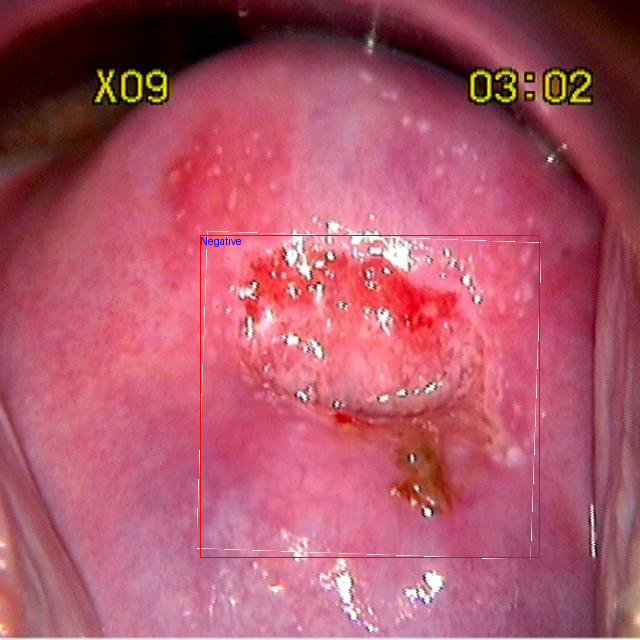

In [2]:
print("Number of training examples:", len(train_dataset))
print("Number of validation examples:", len(val_dataset))
import numpy as np
import os
from PIL import Image, ImageDraw

# based on https://github.com/woctezuma/finetune-detr/blob/master/finetune_detr.ipynb
image_ids = train_dataset.coco.getImgIds()
# let's pick a random image
image_id = image_ids[np.random.randint(0, len(image_ids))]
print('Image n°{}'.format(image_id))
image = train_dataset.coco.loadImgs(image_id)[0]
image = Image.open(os.path.join('/home/toni_intern/datasets/train', image['file_name']))

annotations = train_dataset.coco.imgToAnns[image_id]
draw = ImageDraw.Draw(image, "RGBA")

cats = train_dataset.coco.cats
print(cats)
id2label = {k: v['name'] for k,v in cats.items()}

for annotation in annotations:
  box = annotation['bbox']
  class_idx = annotation['category_id']
  x,y,w,h = tuple(box)
  draw.rectangle((x,y,x+w,y+h), outline='red', width=1)
  draw.text((x, y), id2label[class_idx], fill='blue')

image

## Dataloaders

We define a custom `collate_fn` to batch images together. As DETR resizes images to have a min size of 800 and a max size of 1333, images can have different sizes. We pad images (`pixel_values`) to the largest image in a batch, and create a corresponding `pixel_mask` to indicate which pixels are real (1)/which are padding (0).  

In [3]:
def collate_fn(batch):
  pixel_values = [item[0] for item in batch]
  encoding = processor.pad(pixel_values, return_tensors="pt")
  labels = [item[1] for item in batch]
  batch = {}
  batch['pixel_values'] = encoding['pixel_values']
  batch['pixel_mask'] = encoding['pixel_mask']
  batch['labels'] = labels
  return batch

train_dataloader = DataLoader(train_dataset, collate_fn=collate_fn, batch_size=4, shuffle=True)
val_dataloader = DataLoader(val_dataset, collate_fn=collate_fn, batch_size=2)
batch = next(iter(train_dataloader))
print(f"Batch keys: {batch.keys()}")
pixel_values, target = train_dataset[0]
print(f"Pixel shape: {pixel_values.shape}")
print(f"Target: {target}")

Batch keys: dict_keys(['pixel_values', 'pixel_mask', 'labels'])
Pixel shape: torch.Size([3, 800, 800])
Target: {'size': tensor([800, 800]), 'image_id': tensor([0]), 'class_labels': tensor([2]), 'boxes': tensor([[0.5156, 0.4617, 0.4969, 0.8328]]), 'area': tensor([264834.3750]), 'iscrowd': tensor([0]), 'orig_size': tensor([640, 640])}


## Train Model Using Pytorch Lightning

Here we define a `LightningModule`, which is an `nn.Module` with some extra functionality.

For more information regarding PyTorch Lightning, I recommend the [docs](https://pytorch-lightning.readthedocs.io/en/latest/?_ga=2.35105442.2002381006.1623231889-1738348008.1615553774) as well as the [tutorial notebooks](https://github.com/PyTorchLightning/lightning-tutorials/tree/aeae8085b48339e9bd9ab61d81cc0dc8b0d48f9c/.notebooks/starters).

You can of course just train the model in native PyTorch as an alternative.

In [ ]:
import torch.nn.functional as F
class Detr(pl.LightningModule):
    
    def __init__(self, lr=1e-4, lr_backbone=1e-5, weight_decay=1e-4, id2label=None, threshold=0.9):
        super().__init__()
        self.save_hyperparameters()

        self.id2label = id2label or {0: "cancer",1:"Negative",2:"Positive"}
        self.label2id = {v: k for k, v in self.id2label.items()}
        self.threshold = threshold

        self.model = AutoModelForObjectDetection.from_pretrained(CHECKPOINT,
            num_labels=len(self.id2label),
            id2label=self.id2label,
            label2id=self.label2id,
            ignore_mismatched_sizes=True
        )

        self.lr = lr
        self.lr_backbone = lr_backbone
        self.weight_decay = weight_decay
        self.validation_step_outputs = []

    def forward(self, pixel_values, pixel_mask):
        outputs = self.model(pixel_values=pixel_values, pixel_mask=pixel_mask)

        return outputs

    def common_step(self, batch, batch_idx):
        pixel_values = batch["pixel_values"]
        pixel_mask = batch["pixel_mask"]
        labels = [{k: v.to(self.device) for k, v in t.items()} for t in batch["labels"]]

        outputs = self.model(pixel_values=pixel_values, pixel_mask=pixel_mask, labels=labels)

        loss = outputs.loss
        loss_dict = outputs.loss_dict

        return loss, loss_dict

    def training_step(self, batch, batch_idx):
        self.model.train()

        loss, loss_dict = self.common_step(batch, batch_idx)
        # logs metrics for each training_step,
        # and the average across the epoch
        total_loss = sum(loss_dict.values())
        self.log("training_loss", loss, on_step=True, on_epoch=True, prog_bar=True)

        for k,v in loss_dict.items():
            self.log("train_" + k, v.item())

        opt = self.optimizers()
        if isinstance(opt, list):
            for i, optimizer in enumerate(opt):
                lr = optimizer.param_groups[0]['lr']
                self.log(f'train/lr_group_{i}', lr, on_step=True)
        else:
            self.log('train/lr', opt.param_groups[0]['lr'], on_step=True)
        
        # Log gradient norms
        if batch_idx % 10 == 0:  # Log every 10 steps to avoid overhead
            total_norm = 0
            for p in self.parameters():
                if p.grad is not None:
                    param_norm = p.grad.data.norm(2)
                    total_norm += param_norm.item() ** 2
            total_norm = total_norm ** (1. / 2)
            self.log('train/grad_norm', total_norm, on_step=True)
            
        return loss

    def on_validation_epoch_end(self):
        # Combine all predictions and targets from the epoch
        self.model.eval()

        all_predictions = []
        all_targets = []
        
        for output in self.validation_step_outputs:
            all_predictions.extend(output['predictions'])
            all_targets.extend(output['targets'])
        
        if all_predictions and all_targets:
            # Compute COCO metrics
            try:
                coco_results = self.coco_evaluator.compute(
                    predictions=all_predictions,
                    references=all_targets
                )
                
                # Log COCO metrics
                if coco_results:
                    # Main mAP metrics
                    self.log('val/mAP', coco_results.get('map', 0.0), on_epoch=True, prog_bar=True)
                    self.log('val/mAP_50', coco_results.get('map_50', 0.0), on_epoch=True, prog_bar=True)
                    self.log('val/mAP_75', coco_results.get('map_75', 0.0), on_epoch=True)
                    
                    # Size-specific mAP
                    self.log('val/mAP_small', coco_results.get('map_small', 0.0), on_epoch=True)
                    self.log('val/mAP_medium', coco_results.get('map_medium', 0.0), on_epoch=True)
                    self.log('val/mAP_large', coco_results.get('map_large', 0.0), on_epoch=True)
                    
                    # Average Recall metrics
                    self.log('val/AR_1', coco_results.get('ar_1', 0.0), on_epoch=True)
                    self.log('val/AR_10', coco_results.get('ar_10', 0.0), on_epoch=True)
                    self.log('val/AR_100', coco_results.get('ar_100', 0.0), on_epoch=True)
                    
                    # Size-specific AR
                    self.log('val/AR_small', coco_results.get('ar_small', 0.0), on_epoch=True)
                    self.log('val/AR_medium', coco_results.get('ar_medium', 0.0), on_epoch=True)
                    self.log('val/AR_large', coco_results.get('ar_large', 0.0), on_epoch=True)
                    
                    print(f"Validation mAP: {coco_results.get('map', 0.0):.4f}")
                    print(f"Validation mAP@50: {coco_results.get('map_50', 0.0):.4f}")
                    print(f"Validation mAP@75: {coco_results.get('map_75', 0.0):.4f}")
                    
            except Exception as e:
                print(f"Error computing COCO metrics: {e}")
                self.log('val/mAP', 0.0, on_epoch=True)
        
        # Clear stored outputs
        self.validation_step_outputs.clear()

    def configure_optimizers(self):
        # Separate learning rates for backbone and other parameters
        param_dicts = [
            {"params": [p for n, p in self.named_parameters() if "backbone" not in n and p.requires_grad]},
            {
                "params": [p for n, p in self.named_parameters() if "backbone" in n and p.requires_grad],
                "lr": self.lr_backbone,
            },
        ]
        
        optimizer = torch.optim.AdamW(param_dicts, lr=self.lr, weight_decay=self.weight_decay)
        
        # Optional: Add learning rate scheduler
        scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=200, gamma=0.1)
        
        return {
            "optimizer": optimizer,
            "lr_scheduler": {
                "scheduler": scheduler,
                "monitor": "val/total_loss",
                "frequency": 1
            }
        }
    def post_process_predictions(self, outputs, target_sizes):

        """
        Post-process the raw predictions from DETR to get final detections
        """
        # This function should convert raw DETR outputs to processed predictions
        # Adjust based on your specific DETR implementation
        
        logits = outputs.logits  # [batch_size, num_queries, num_classes]
        pred_boxes = outputs.pred_boxes  # [batch_size, num_queries, 4]
        
        # Apply sigmoid to get probabilities
        probs = F.softmax(logits, dim=-1)
        
        # Get the class with highest probability (excluding no-object class)
        scores, labels = probs[..., :-1].max(-1)
        
        processed_predictions = []
        for i, (score, label, box) in enumerate(zip(scores, labels, pred_boxes)):
            # Convert normalized coordinates to pixel coordinates if needed
            # This depends on your DETR implementation
            processed_predictions.append({
                'boxes': box,
                'labels': label,
                'scores': score
            })
        
        return processed_predictions
    
    def test_step(self, batch, batch_idx):
        self.model.eval()
        outputs = self(pixel_values=batch['pixel_values'], pixel_mask=batch['pixel_mask'])
        
        loss_dict = outputs.loss_dict if hasattr(outputs, 'loss_dict') else {}
        total_loss = outputs.loss if hasattr(outputs, 'loss') else sum(loss_dict.values())
        
        # Log test losses
        self.log('test/total_loss', total_loss, on_step=False, on_epoch=True)
        
        if loss_dict:
            for loss_name, loss_value in loss_dict.items():
                self.log(f'test/{loss_name}', loss_value, on_step=False, on_epoch=True)
        
        return {'test_loss': total_loss}
    
    def configure_optimizers(self):
        # Separate learning rates for backbone and other parameters
        param_dicts = [
            {"params": [p for n, p in self.named_parameters() if "backbone" not in n and p.requires_grad]},
            {
                "params": [p for n, p in self.named_parameters() if "backbone" in n and p.requires_grad],
                "lr": self.lr_backbone,
            },
        ]
        
        optimizer = torch.optim.AdamW(param_dicts, lr=self.lr, weight_decay=self.weight_decay)
        
        # Optional: Add learning rate scheduler
        scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=200, gamma=0.1)
        
        return {
            "optimizer": optimizer,
            "lr_scheduler": {
                "scheduler": scheduler,
                "monitor": "val/total_loss",
                "frequency": 1
            }
        }

    def train_dataloader(self):
        return train_dataloader

    def val_dataloader(self):
        return val_dataloader

# Setup loggers
from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.callbacks import ModelCheckpoint, LearningRateMonitor
from lightning.pytorch.loggers import MLFlowLogger

tensorboard_logger = TensorBoardLogger(
    save_dir="logs/",
    name="detr_experiment",
    version=None,  # Auto-increment version
    default_hp_metric=False
)
checkpoint_callback = ModelCheckpoint(
    monitor='val/mAP',  # Monitor mAP instead of loss
    dirpath='checkpoints/',
    filename='detr-{epoch:02d}-{val_mAP:.4f}',
    save_top_k=3,
    mode='max',  # Maximize mAP
    save_last=True
)

# Custom callback for additional logging
metrics_logger = MLFlowLogger(experiment_name="lightning_logs", tracking_uri="file:./ml-runs")
lr_monitor = LearningRateMonitor(logging_interval='step')

In [ ]:
from pytorch_lightning import Trainer
device_available = "cuda" if torch.cuda.is_available() else "cpu"
#device_available = "cpu"
print(f"Using device: {device_available}")

# Fix for CUDA environment issues
if device_available == "cuda":
    try:
        # Test CUDA initialization
        torch.cuda.empty_cache()
        print(f"CUDA devices available: {torch.cuda.device_count()}")
        print(f"Current CUDA device: {torch.cuda.current_device()}")
    except RuntimeError as e:
        print(f"CUDA error detected: {e}")
        print("Falling back to CPU training")
        device_available = "cpu"

# Model definition and verification of outputs
id2label = {0: "cancer", 1: "Negative", 2: "Positive"}

model = Detr(
    lr=1e-4,
    lr_backbone=1e-5,
    weight_decay=1e-4,
    id2label=id2label
)

model.train()

outputs = model(pixel_values=batch['pixel_values'], pixel_mask=batch['pixel_mask'])
print(f"Shape of outputs: {outputs.logits.shape}")

# Setup trainer with comprehensive logging
trainer = Trainer(
    max_epochs=100,
    gradient_clip_val=0.1,
    logger=[tensorboard_logger],  # Add wandb_logger if using WandB
    callbacks=[checkpoint_callback, lr_monitor, metrics_logger],
    log_every_n_steps=1,  # Log every step
    val_check_interval=50,  # Validate every 50 training steps
    enable_progress_bar=True,
    enable_model_summary=True,
    precision=16,  # Optional: use mixed precision for faster training
    logger = metrics_logger #This added line allows us to track all the logging.
)
trainer.fit(model)

print("Training completed! Check logs in:")
print(f"- TensorBoard: tensorboard --logdir {tensorboard_logger.log_dir}")
print("- Checkpoints: ./checkpoints/")

model_save_dir = "./saved_models/detr-finetuned-cerv_AI-v2"
os.makedirs(model_save_dir, exist_ok=True)

# Save the model and processor locally
print("Saving model and processor locally...")
model.model.save_pretrained(model_save_dir)
processor.save_pretrained(model_save_dir)
print(f"Model and processor saved to: {model_save_dir}")

Using device: cuda
CUDA devices available: 1
Current CUDA device: 0


Some weights of the model checkpoint at facebook/detr-resnet-50 were not used when initializing DetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of DetrForObjectDetection were not initialized from the model checkpoin

Shape of outputs: torch.Size([4, 100, 4])



  | Name  | Type                   | Params | Mode 
---------------------------------------------------------
0 | model | DetrForObjectDetection | 41.5 M | train
---------------------------------------------------------
41.3 M    Trainable params
222 K     Non-trainable params
41.5 M    Total params
166.009   Total estimated model params size (MB)
399       Modules in train mode
0         Modules in eval mode


Epoch 99: 100%|██████████| 264/264 [01:46<00:00,  2.47it/s, v_num=24, training_loss_step=0.0564, training_loss_epoch=0.128]

`Trainer.fit` stopped: `max_epochs=100` reached.


Epoch 99: 100%|██████████| 264/264 [01:48<00:00,  2.43it/s, v_num=24, training_loss_step=0.0564, training_loss_epoch=0.128]
Training completed! Check logs in:
- TensorBoard: tensorboard --logdir logs/detr_experiment/version_24
- Checkpoints: ./checkpoints/
Saving model and processor locally...
Model and processor saved to: ./saved_models/detr-finetuned-cerv_AI-v2


We can easily reload the model, and move it to the GPU as follows:

In [7]:
import torchvision.ops as ops
import torch

def apply_nms(predictions, iou_threshold=0.5):
    """
    Apply Non-Maximum Suppression (NMS) to model predictions.

    Args:
        predictions (dict): A dict with keys 'scores', 'labels', 'boxes'
        iou_threshold (float): IOU threshold for NMS

    Returns:
        dict: Filtered predictions after NMS
    """
    boxes = predictions['boxes']
    scores = predictions['scores']
    labels = predictions['labels']
    
    # Perform NMS separately for each class
    keep_indices = []
    for class_id in torch.unique(labels):
        class_indices = (labels == class_id).nonzero(as_tuple=True)[0]
        class_boxes = boxes[class_indices]
        class_scores = scores[class_indices]
        
        if len(class_boxes) == 0:
            continue
        
        keep = ops.nms(class_boxes, class_scores, iou_threshold)
        keep_indices.extend(class_indices[keep].tolist())
    
    # Return filtered predictions
    return {
        'boxes': boxes[keep_indices],
        'scores': scores[keep_indices],
        'labels': labels[keep_indices]
    }

## Loading Pretrained Weights

In [ ]:
from transformers import DetrForObjectDetection, DetrImageProcessor
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import torch
import random
from datetime import datetime
import os

# Load your fine-tuned model
model = AutoModelForObjectDetection.from_pretrained('./saved_models/detr-finetuned-cerv_AI-v2', local_files_only=True)
processor = AutoImageProcessor.from_pretrained('./saved_models/detr-finetuned-cerv_AI-v2', local_files_only=True)

## Inference


VISUALIZING PREDICTIONS
Loading trained model...
Processing 12 images...
Predictions saved as: DETR_prediction_20250611_163351.png


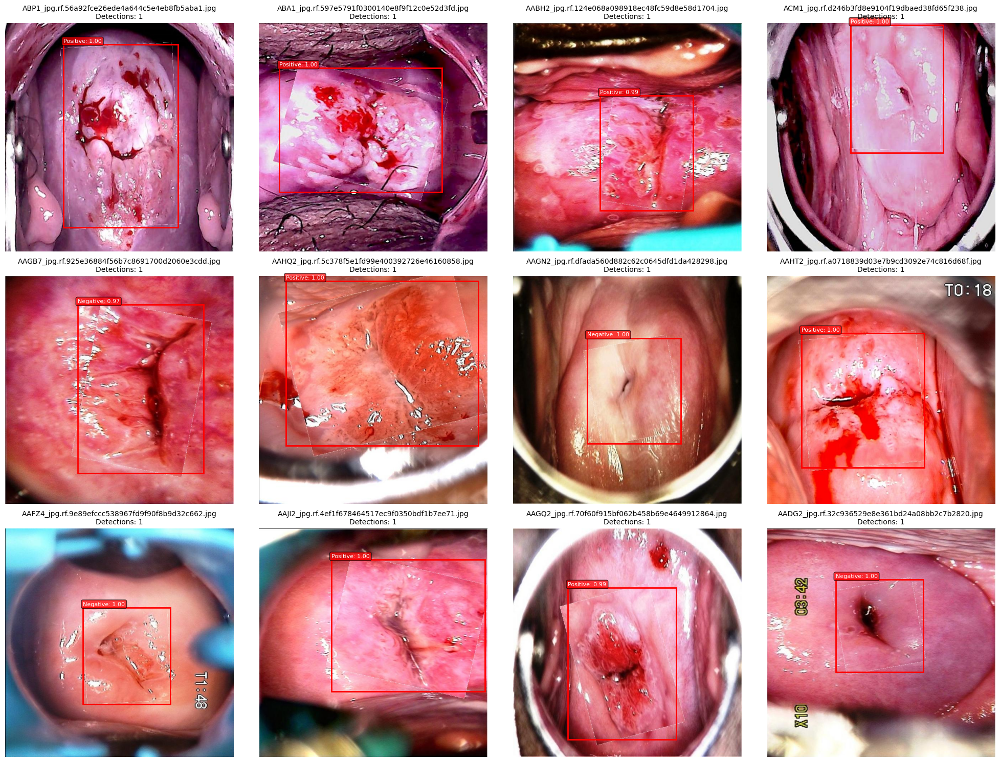

Loading trained model for comparison...
Comparing predictions with ground truth for 12 images...
Comparison saved as: DETR_comparison_20250611_163407.png


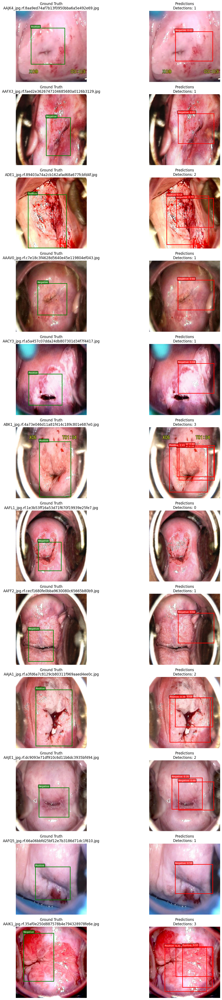

In [ ]:
def visualize_predictions(test_dataset_path, num_images=12, confidence_threshold=0.5):
    """
    Load the trained model and visualize predictions on test images
    
    Args:
        model_path (str): Path to the saved model
        test_dataset_path (str): Path to test dataset folder
        num_images (int): Number of images to visualize
        confidence_threshold (float): Confidence threshold for displaying predictions
    """

    # Load the trained model and processor
    print("Loading trained model...")
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)
    model.eval()
    
    # Get list of images from test dataset
    image_files = []
    for file in os.listdir(test_dataset_path):
        if file.lower().endswith(('.png', '.jpg', '.jpeg')):
            image_files.append(file)
    
    # Randomly select images
    if len(image_files) < num_images:
        print(f"Warning: Only {len(image_files)} images available, using all of them")
        selected_images = image_files
    else:
        selected_images = random.sample(image_files, num_images)
    
    # Create a figure with subplots
    fig, axes = plt.subplots(3, 4, figsize=(20, 15))
    axes = axes.flatten()
    
    # COCO class names (you may want to customize this based on your dataset)
    # If you have custom classes, replace this with your class names
    if hasattr(val_dataset, 'coco') and hasattr(val_dataset.coco, 'cats'):
        # Use your dataset's class names
        id2label = {cat_id: cat_info['name'] for cat_id, cat_info in val_dataset.coco.cats.items()}
    else:
        # Default COCO classes - replace with your actual class names
        id2label = {
            0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus',
            6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant',
            # Add more classes as needed based on your dataset
        }
    
    print(f"Processing {len(selected_images)} images...")
    
    for idx, image_file in enumerate(selected_images):
        if idx >= len(axes):
            break
            
        # Load and process image
        image_path = os.path.join(test_dataset_path, image_file)
        image = Image.open(image_path).convert('RGB')
        
        # Prepare image for model
        inputs = processor(images=image, return_tensors="pt")
        inputs = {k: v.to(device) for k, v in inputs.items()}
        
        # Get predictions
        with torch.no_grad():
            outputs = model(**inputs)
        
        # Post-process predictions
        target_sizes = torch.tensor([image.size[::-1]]).to(device)  # (height, width)
        results = processor.post_process_object_detection(
            outputs, target_sizes=target_sizes, threshold=confidence_threshold
        )[0]
        results = apply_nms(results, iou_threshold=0.5)
        
        # Plot image with predictions
        ax = axes[idx]
        ax.imshow(image)
        ax.set_title(f'{image_file}\nDetections: {len(results["scores"])}', fontsize=10)
        ax.axis('off')
        
        # Draw bounding boxes and labels
        for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
            box = box.cpu().numpy()
            score = score.cpu().numpy()
            label = label.cpu().numpy()
            
            # Convert box format (x_min, y_min, x_max, y_max)
            x_min, y_min, x_max, y_max = box
            width = x_max - x_min
            height = y_max - y_min
            
            # Create rectangle patch
            rect = patches.Rectangle(
                (x_min, y_min), width, height,
                linewidth=2, edgecolor='red', facecolor='none'
            )
            ax.add_patch(rect)
            
            # Add label with confidence score
            label_name = id2label.get(int(label), f'class_{int(label)}')
            ax.text(
                x_min, y_min - 5,
                f'{label_name}: {score:.2f}',
                bbox=dict(boxstyle='round,pad=0.3', facecolor='red', alpha=0.7),
                fontsize=8, color='white'
            )
    
    # Hide empty subplots
    for idx in range(len(selected_images), len(axes)):
        axes[idx].axis('off')
    
    plt.tight_layout()
    
    # Save the plot with timestamp
    current_date = datetime.now().strftime("%Y%m%d_%H%M%S")
    save_path = f"DETR_prediction_{current_date}.png"
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    print(f"Predictions saved as: {save_path}")
    
    plt.show()
    
    return save_path

# Function to compare predictions with ground truth
def compare_predictions_with_gt(test_dataset_path, num_images=6, confidence_threshold=0.5):
    """
    Compare model predictions with ground truth annotations
    
    Args:
        model_path (str): Path to the saved model
        test_dataset_path (str): Path to test dataset folder
        num_images (int): Number of images to compare
        confidence_threshold (float): Confidence threshold for displaying predictions
    """
    
    # Load the trained model and processor
    print("Loading trained model for comparison...")
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)
    model.eval()
    
    # Load ground truth annotations
    ann_file = os.path.join(test_dataset_path, "_annotations.coco.json")
    with open(ann_file, 'r') as f:
        coco_data = json.load(f)
    
    # Create image id to annotations mapping
    img_id_to_anns = {}
    for ann in coco_data['annotations']:
        img_id = ann['image_id']
        if img_id not in img_id_to_anns:
            img_id_to_anns[img_id] = []
        img_id_to_anns[img_id].append(ann)
    
    # Create category mapping
    id2label = {cat['id']: cat['name'] for cat in coco_data['categories']}
    
    # Select random images that have annotations
    images_with_anns = [img for img in coco_data['images'] if img['id'] in img_id_to_anns]
    selected_images = random.sample(images_with_anns, min(num_images, len(images_with_anns)))
    
    # Create figure for comparison
    fig, axes = plt.subplots(num_images, 2, figsize=(16, 4 * num_images))
    if num_images == 1:
        axes = axes.reshape(1, -1)
    
    print(f"Comparing predictions with ground truth for {len(selected_images)} images...")
    
    for idx, img_info in enumerate(selected_images):
        image_path = os.path.join(test_dataset_path, img_info['file_name'])
        image = Image.open(image_path).convert('RGB')
        
        # Get ground truth annotations
        gt_anns = img_id_to_anns.get(img_info['id'], [])
        
        # Get model predictions
        inputs = processor(images=image, return_tensors="pt")
        inputs = {k: v.to(device) for k, v in inputs.items()}
        
        with torch.no_grad():
            encoding = processor(images=img, return_tensors="pt").to(device)
            outputs = model(**encoding)
        
        target_sizes = torch.tensor([image.size[::-1]]).to(device)
        results = processor.post_process_object_detection(
            outputs, target_sizes=target_sizes, threshold=confidence_threshold
        )[0]
        results = apply_nms(results, iou_threshold=0.5)
        
        # Plot ground truth
        ax_gt = axes[idx, 0]
        ax_gt.imshow(image)
        ax_gt.set_title(f'Ground Truth\n{img_info["file_name"]}', fontsize=12)
        ax_gt.axis('off')
        
        for ann in gt_anns:
            bbox = ann['bbox']  # [x, y, width, height]
            x, y, width, height = bbox
            
            rect = patches.Rectangle(
                (x, y), width, height,
                linewidth=2, edgecolor='green', facecolor='none'
            )
            ax_gt.add_patch(rect)
            
            label_name = id2label.get(ann['category_id'], f'class_{ann["category_id"]}')
            ax_gt.text(
                x, y - 5,
                label_name,
                bbox=dict(boxstyle='round,pad=0.3', facecolor='green', alpha=0.7),
                fontsize=8, color='white'
            )
        
        # Plot predictions
        ax_pred = axes[idx, 1]
        ax_pred.imshow(image)
        ax_pred.set_title(f'Predictions\nDetections: {len(results["scores"])}', fontsize=12)
        ax_pred.axis('off')
        
        for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
            box = box.cpu().numpy()
            score = score.cpu().numpy()
            label = label.cpu().numpy()
            
            x_min, y_min, x_max, y_max = box
            width = x_max - x_min
            height = y_max - y_min
            
            rect = patches.Rectangle(
                (x_min, y_min), width, height,
                linewidth=2, edgecolor='red', facecolor='none'
            )
            ax_pred.add_patch(rect)
            
            label_name = id2label.get(int(label), f'class_{int(label)}')
            ax_pred.text(
                x_min, y_min - 5,
                f'{label_name}: {score:.2f}',
                bbox=dict(boxstyle='round,pad=0.3', facecolor='red', alpha=0.7),
                fontsize=8, color='white'
            )
    
    plt.tight_layout()
    
    # Save comparison plot
    current_date = datetime.now().strftime("%Y%m%d_%H%M%S")
    save_path = f"DETR_comparison_{current_date}.png"
    plt.savefig(save_path, dpi=300, bbox_inches='tight')
    print(f"Comparison saved as: {save_path}")
    
    plt.show()
    
    return save_path

# Call the visualization functions after training
print("\n" + "="*50)
print("VISUALIZING PREDICTIONS")
print("="*50)

model_save_dir = '/home/toni_intern/saved_models/detr-finetuned-cerv_AI-v2'

# Visualize predictions on test images
prediction_plot = visualize_predictions(
    test_dataset_path='/home/toni_intern/datasets/train',
    num_images=12,
    confidence_threshold=0.3
)

# Compare predictions with ground truth
comparison_plot = compare_predictions_with_gt(
    test_dataset_path='/home/toni_intern/datasets/test',
    num_images=12,
    confidence_threshold=0.3
)

## Evaluation: Attention Rollout

### 🔍 What the Attention Distribution Shows

The histogram displays the frequency distribution of attention values across all pixels in the heatmap. Here's what each part means:
#### X-axis: Attention Value
- Range: 0.0 to 1.0 (normalized attention intensity)
- 0.0: No attention (completely ignored pixels)
- 1.0: Maximum attention (most important pixels)

### Y-axis: Frequency
- How many pixels have each attention value
- Higher bars = more pixels at that attention level

In [ ]:
import torch
import torchvision.transforms as T
import matplotlib.pyplot as plt
import numpy as np
import os
from PIL import Image
from safetensors.torch import load_file
from ultralytics import RTDETR
from ultralytics.models.rtdetr.model import RTDETRDetectionModel
from scipy.ndimage import gaussian_filter
import cv2

# --- CONFIG ---
MODEL_SAFETENSORS_PATH = "/home/toni_intern/cervAI/saved_models/rt-detr-finetuned-cerv_AI-v1/model.safetensors"
#MODEL_CONFIG_PATH = "/home/toni_intern/RT-DETR/runs/detect/train6/weights/config.yaml"  # Optional: if you have config
IMAGE_DIR = ",/datasets/test/images"
QUERY_IDX = 40  # Which query index to visualize
IMG_SIZE = 640

# --- Load RT-DETR from SafeTensors ---
def load_model_from_safetensors():
    """Load RT-DETR model from SafeTensors format."""
    try:
        # Load the state dict from safetensors
        state_dict = load_file(MODEL_SAFETENSORS_PATH)
        
        # Create a base RT-DETR model
        model = RTDETR('rtdetr-l.pt')  # This downloads the base model temporarily
        
        # Load the custom weights
        model.model.load_state_dict(state_dict, strict=False)
        model.model.eval()
        
        return model.model
        
    except Exception as e:
        print(f"Error loading from safetensors: {e}")
        print("Attempting alternative loading method...")
        return load_model_alternative()

def load_model_alternative():
    """Alternative method: Convert safetensors to temporary .pt file"""
    try:
        # Load safetensors
        state_dict = load_file(MODEL_SAFETENSORS_PATH)
        
        # Create temporary .pt file
        temp_pt_path = MODEL_SAFETENSORS_PATH.replace('.safetensors', '_temp.pt')
        
        # Save as .pt temporarily
        torch.save({
            'model': state_dict,
            'epoch': -1,
            'best_fitness': 0.0,
            'ema': None,
            'updates': 0,
            'optimizer': None,
            'wandb_id': None,
            'date': None
        }, temp_pt_path)
        
        # Load with ultralytics
        model = RTDETR(temp_pt_path).model.eval()
        
        # Clean up temporary file
        if os.path.exists(temp_pt_path):
            os.remove(temp_pt_path)
            
        return model
        
    except Exception as e:
        print(f"Alternative loading failed: {e}")
        raise

# --- Load and preprocess one image ---
def load_image(image_dir,QUERY_IDX):
    img_files = [f for f in os.listdir(image_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    if not img_files:
        raise ValueError(f"No image files found in {image_dir}")
    
    img_path = os.path.join(image_dir, img_files[QUERY_IDX])
    img = Image.open(img_path).convert('RGB')
    
    # Keep original for visualization
    original_img = img.copy()
    
    transform = T.Compose([
        T.Resize((IMG_SIZE, IMG_SIZE)),
        T.ToTensor(),
        T.Normalize([0.485, 0.456, 0.406],
                    [0.229, 0.224, 0.225])
    ])
    return original_img, img, transform(img).unsqueeze(0)

# --- Register comprehensive attention hooks ---
def register_attention_hooks(model, storage):
    """Register hooks to capture multi-scale attention maps"""
    
    def get_decoder_layer():
        """Find the decoder layer in the model"""
        try:
            # Common patterns for RT-DETR
            if hasattr(model, 'model') and hasattr(model.model[28], 'decoder'):
                return model.model[28].decoder.layers[0]
            elif hasattr(model, 'decoder'):
                return model.decoder.layers[0]
            else:
                # Search through model structure
                for name, module in model.named_modules():
                    if 'decoder' in name.lower() and hasattr(module, 'layers'):
                        return module.layers[0]
                raise AttributeError("Decoder not found")
        except Exception as e:
            print(f"Error finding decoder: {e}")
            return None

    decoder_layer = get_decoder_layer()
    if decoder_layer is None:
        return False
    
    # Hook for self-attention
    def self_attention_hook(module, input, output):
        if hasattr(module, 'attn'):
            storage['self_attention'] = output.detach().cpu()
    
    # Hook for cross-attention (deformable attention)
    def cross_attention_hook(module, input, output):
        storage['cross_attention'] = output.detach().cpu()
    
    # Hook for the deformable attention mechanism
    def deformable_attention_hook(query, reference_points, input_flatten, input_spatial_shapes, input_level_start_index, input_padding_mask=None):
        try:
            if not isinstance(input_spatial_shapes, torch.Tensor):
                input_spatial_shapes = torch.tensor(input_spatial_shapes, dtype=torch.float32, device=query.device)

            N, Len_q, _ = query.shape
            ms_deform_attn = storage['ms_deform_attn']
            
            # Get sampling offsets and attention weights
            sampling_offsets = ms_deform_attn.sampling_offsets(query).view(
                N, Len_q, ms_deform_attn.n_heads, ms_deform_attn.n_levels, ms_deform_attn.n_points, 2
            )
            attention_weights = ms_deform_attn.attention_weights(query).view(
                N, Len_q, ms_deform_attn.n_heads, ms_deform_attn.n_levels, ms_deform_attn.n_points
            )
            
            # Normalize attention weights
            attention_weights = torch.softmax(attention_weights, dim=-1)
            
            # Compute sampling locations
            reference_points = reference_points[:, :, None, :, None, :2]
            offsets = sampling_offsets / input_spatial_shapes[None, None, None, :, None, :]
            sampling_locations = reference_points + offsets
            
            # Store all relevant data
            storage['sampling_locations'] = sampling_locations.detach().cpu()
            storage['attention_weights'] = attention_weights.detach().cpu()
            storage['reference_points'] = reference_points.detach().cpu()
            storage['input_spatial_shapes'] = input_spatial_shapes.detach().cpu()
            storage['query_embeddings'] = query.detach().cpu()
            
        except Exception as e:
            print(f"Error in deformable attention hook: {e}")
            storage['hook_error'] = str(e)
        
        return torch.zeros_like(query)
    
    # Register hooks
    try:
        if hasattr(decoder_layer, 'self_attn'):
            decoder_layer.self_attn.register_forward_hook(self_attention_hook)
        
        if hasattr(decoder_layer, 'cross_attn'):
            ms_deform_attn = decoder_layer.cross_attn
            storage['ms_deform_attn'] = ms_deform_attn
            storage['original_forward'] = ms_deform_attn.forward
            ms_deform_attn.forward = deformable_attention_hook
            decoder_layer.cross_attn.register_forward_hook(cross_attention_hook)
        
        return True
    except Exception as e:
        print(f"Error registering hooks: {e}")
        return False

# --- Generate attention heatmaps ---
def generate_attention_heatmap(storage, query_idx, img_size, heatmap_size=64):
    """Generate GRAD-CAM style attention heatmap"""
    
    if 'sampling_locations' not in storage or 'attention_weights' not in storage:
        print("Missing attention data for heatmap generation")
        return None
    
    try:
        sampling_locs = storage['sampling_locations'][0]  # [queries, heads, levels, points, 2]
        attention_weights = storage['attention_weights'][0]  # [queries, heads, levels, points]
        
        if query_idx >= sampling_locs.shape[0]:
            print(f"Query index {query_idx} out of range. Max: {sampling_locs.shape[0]-1}")
            return None
        
        # Get data for specific query
        query_locs = sampling_locs[query_idx]  # [heads, levels, points, 2]
        query_weights = attention_weights[query_idx]  # [heads, levels, points]
        
        # Create heatmap
        heatmap = np.zeros((heatmap_size, heatmap_size))
        
        # Process each head and level
        for head_idx in range(query_locs.shape[0]):
            for level_idx in range(query_locs.shape[1]):
                locs = query_locs[head_idx, level_idx].numpy()  # [points, 2]
                weights = query_weights[head_idx, level_idx].numpy()  # [points]
                
                # Convert normalized coordinates to heatmap coordinates
                x_coords = np.clip(locs[:, 0] * heatmap_size, 0, heatmap_size-1).astype(int)
                y_coords = np.clip(locs[:, 1] * heatmap_size, 0, heatmap_size-1).astype(int)
                
                # Add weighted attention to heatmap
                for i, (x, y) in enumerate(zip(x_coords, y_coords)):
                    heatmap[y, x] += weights[i]
        
        # Normalize heatmap
        if heatmap.max() > 0:
            heatmap = heatmap / heatmap.max()
        
        # Apply Gaussian smoothing for better visualization
        heatmap = gaussian_filter(heatmap, sigma=1.0)
        
        # Resize to image size
        heatmap_resized = cv2.resize(heatmap, img_size, interpolation=cv2.INTER_CUBIC)
        
        return heatmap_resized
        
    except Exception as e:
        print(f"Error generating heatmap: {e}")
        return None

# --- Visualize GRAD-CAM style attention ---
def visualize_gradcam_attention(original_img, storage, query_idx):
    """Create GRAD-CAM style visualization"""
    
    # Generate heatmap
    heatmap = generate_attention_heatmap(storage, query_idx, original_img.size)
    
    if heatmap is None:
        print("Failed to generate heatmap")
        return
    
    # Convert PIL to numpy
    img_array = np.array(original_img)
    
    # Create colored heatmap
    heatmap_colored = plt.cm.jet(heatmap)[:, :, :3]  # Remove alpha channel
    heatmap_colored = (heatmap_colored * 255).astype(np.uint8)
    
    # Overlay heatmap on image
    alpha = 0.6  # Transparency
    overlay = cv2.addWeighted(img_array, 1-alpha, heatmap_colored, alpha, 0)
    
    # Create visualization
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    
    # Original image
    axes[0, 0].imshow(original_img)
    axes[0, 0].set_title('Original Image')
    axes[0, 0].axis('off')
    
    # Attention heatmap only
    im1 = axes[0, 1].imshow(heatmap, cmap='jet', alpha=0.8)
    axes[0, 1].set_title(f'Attention Heatmap - Query {query_idx}')
    axes[0, 1].axis('off')
    plt.colorbar(im1, ax=axes[0, 1], fraction=0.046, pad=0.04)
    
    # Overlay
    axes[1, 0].imshow(overlay)
    axes[1, 0].set_title('GRAD-CAM Style Overlay')
    axes[1, 0].axis('off')
    
    # Attention statistics
    axes[1, 1].hist(heatmap.flatten(), bins=50, alpha=0.7, edgecolor='black')
    axes[1, 1].set_title('Attention Distribution')
    axes[1, 1].set_xlabel('Attention Value')
    axes[1, 1].set_ylabel('Frequency')
    axes[1, 1].grid(True, alpha=0.3)
    
    plt.tight_layout()
    
    # Save visualization
    output_path = f'rtdetr_gradcam_query_{query_idx}.jpg'
    plt.savefig(output_path, dpi=300, bbox_inches='tight')
    plt.close()
    
    # Save just the overlay
    overlay_path = f'rtdetr_overlay_query_{query_idx}.jpg'
    cv2.imwrite(overlay_path, cv2.cvtColor(overlay, cv2.COLOR_RGB2BGR))
    
    print(f"✓ GRAD-CAM visualizations saved:")
    print(f"  - Full visualization: {output_path}")
    print(f"  - Overlay only: {overlay_path}")
    print(f"  - Max attention value: {heatmap.max():.4f}")
    print(f"  - Mean attention value: {heatmap.mean():.4f}")

def cleanup_hooks(storage):
    """Restore original forward methods"""
    if 'original_forward' in storage and 'ms_deform_attn' in storage:
        storage['ms_deform_attn'].forward = storage['original_forward']

# --- Main ---
def main():
    print("🚀 Starting RT-DETR GRAD-CAM Style Attention Visualization...")
    
    # Load model
    print("\n📦 Loading RT-DETR model from SafeTensors...")
    try:
        model = load_model_from_safetensors()
        print("✓ Model loaded successfully from SafeTensors")
    except Exception as e:
        print(f"✗ Failed to load model: {e}")
        return
    
    # Load image
    print("\n🖼️  Loading and preprocessing image...")
    try:
        original_img, processed_img, img_tensor = load_image(IMAGE_DIR,QUERY_IDX)
        print(f"✓ Image loaded: {original_img.size}")
    except Exception as e:
        print(f"✗ Failed to load image: {e}")
        return
    
    # Register hooks
    print("\n🎣 Registering attention hooks...")
    storage = {}
    if register_attention_hooks(model, storage):
        print("✓ Attention hooks registered successfully")
    else:
        print("✗ Failed to register attention hooks")
        return
    
    # Forward pass
    print("\n⚡ Running forward pass to capture attention...")
    try:
        with torch.no_grad():
            outputs = model(img_tensor)
        print("✓ Forward pass completed")
        
        if 'hook_error' in storage:
            print(f"⚠️  Hook warning: {storage['hook_error']}")
    except Exception as e:
        print(f"✗ Forward pass failed: {e}")
        cleanup_hooks(storage)
        return
    
    # Generate visualization
    print(f"\n🎨 Generating GRAD-CAM style visualization for query {QUERY_IDX}...")
    try:
        visualize_gradcam_attention(original_img, processed_img, storage, QUERY_IDX)
    except Exception as e:
        print(f"✗ Visualization failed: {e}")
    
    # Cleanup
    cleanup_hooks(storage)
    print("\n✅ RT-DETR GRAD-CAM attention visualization completed!")
    
    # Show available queries info
    if 'query_embeddings' in storage:
        num_queries = storage['query_embeddings'].shape[1]
        print(f"\n💡 Tip: This model has {num_queries} queries. Try different QUERY_IDX values (0-{num_queries-1})")

if __name__ == "__main__":
    main()

🚀 Starting RT-DETR GRAD-CAM Style Attention Visualization...

📦 Loading RT-DETR model from SafeTensors...
✓ Model loaded successfully from SafeTensors

🖼️  Loading and preprocessing image...
✓ Image loaded: (640, 640)

🎣 Registering attention hooks...
✓ Attention hooks registered successfully

⚡ Running forward pass to capture attention...
✓ Forward pass completed

🎨 Generating GRAD-CAM style visualization for query 40...
✓ GRAD-CAM visualizations saved:
  - Full visualization: rtdetr_gradcam_query_40.jpg
  - Overlay only: rtdetr_overlay_query_40.jpg
  - Max attention value: 0.2781
  - Mean attention value: 0.0073

✅ RT-DETR GRAD-CAM attention visualization completed!

💡 Tip: This model has 300 queries. Try different QUERY_IDX values (0-299)
